In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from PIL import Image
import cv2
from tqdm import tqdm
import keras
import tensorflow as tf
from tqdm import tqdm
from helper_functions_nb import *
AUTOTUNE = tf.data.experimental.AUTOTUNE

In [2]:
# read file names from json
df = pd.read_json('Datasets\S5Mars_data\split\\train.json')

In [3]:
# read images and masks
train = df.to_numpy()
train = train[:1000]
train_images = np.array([np.array(Image.open('Datasets/S5Mars_data/images/'+str(i[0])+'.jpg')) for i in tqdm(train)])
train_labels = np.array([np.array(Image.open('Datasets/S5Mars_data/labels/'+str(i[0])+'.png')) for i in tqdm(train)])

val_df = pd.read_json('Datasets\S5Mars_data\split\\val.json')
val = val_df.to_numpy()
val_images = np.array([np.array(Image.open('Datasets/S5Mars_data/images/'+str(i[0])+'.jpg')) for i in tqdm(val)])
val_labels = np.array([np.array(Image.open('Datasets/S5Mars_data/labels/'+str(i[0])+'.png')) for i in tqdm(val)])

100%|██████████| 1000/1000 [00:07<00:00, 139.82it/s]
C:\Users\Davide\AppData\Local\Temp\ipykernel_34716\2195800304.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  train_images = np.array([np.array(Image.open('Datasets/S5Mars_data/images/'+str(i[0])+'.jpg')) for i in tqdm(train)])
100%|██████████| 1000/1000 [00:04<00:00, 241.30it/s]
C:\Users\Davide\AppData\Local\Temp\ipykernel_34716\2195800304.py:5: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  train_labels = np.array([np.array(Image.open('Datasets/S5Mars_data/labels/'+str(i[0])+'.png')) for i in 

In [4]:
test_df = pd.read_json('Datasets\S5Mars_data\split\\test.json')
test = test_df.to_numpy()
test_images = np.array([np.array(Image.open('Datasets/S5Mars_data/images/'+str(i[0])+'.jpg')) for i in tqdm(test)])
test_labels = np.array([np.array(Image.open('Datasets/S5Mars_data/labels/'+str(i[0])+'.png')) for i in tqdm(test)])

100%|██████████| 800/800 [00:05<00:00, 138.02it/s]
C:\Users\Davide\AppData\Local\Temp\ipykernel_34716\2971133293.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  test_images = np.array([np.array(Image.open('Datasets/S5Mars_data/images/'+str(i[0])+'.jpg')) for i in tqdm(test)])
100%|██████████| 800/800 [00:03<00:00, 244.11it/s]
C:\Users\Davide\AppData\Local\Temp\ipykernel_34716\2971133293.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  test_labels = np.array([np.array(Image.open('Datasets/S5Mars_data/labels/'+str(i[0])+'.png')) for i in tqdm(te

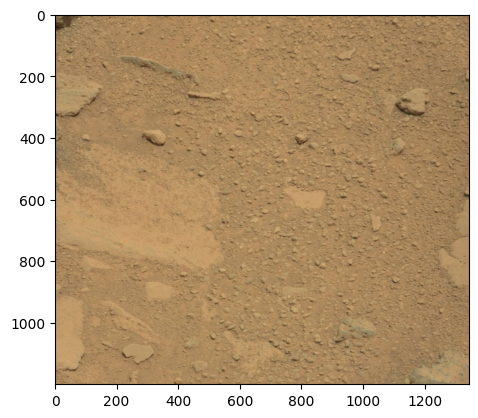

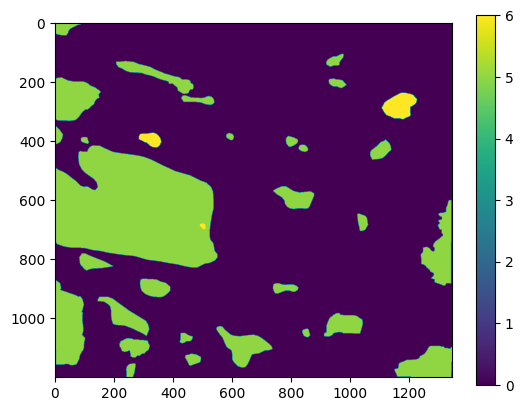

In [5]:
# show sample image and mask
i = 4
plt.imshow(train_images[i])
plt.show()
plt.imshow(train_labels[i])
plt.colorbar()
plt.show()

In [6]:

# resize images and masks to 224x224
train_images = np.array([cv2.resize(image, (224, 224)) for image in tqdm(train_images)])
# normalize images
train_images = train_images / 255.0
train_labels = np.array([cv2.resize(label, (224, 224)) for label in tqdm(train_labels)])

val_images = np.array([cv2.resize(image, (224, 224)) for image in tqdm(val_images)])
val_images = val_images / 255.0
val_labels = np.array([cv2.resize(label, (224, 224)) for label in tqdm(val_labels)])

test_images = np.array([cv2.resize(image, (224, 224)) for image in tqdm(test_images)])
test_images = test_images / 255.0
test_labels = np.array([cv2.resize(label, (224, 224)) for label in tqdm(test_labels)])

100%|██████████| 800/800 [00:00<00:00, 8740.55it/s]


In [7]:
def filter_images_and_masks(images, masks, thresholds={0: 0, 1: 200, 2: 0}):
    valid_indices = []
    
    for i in tqdm(range(masks.shape[0])):
        unique_vals, counts = np.unique(masks[i], return_counts=True)
        val_counts = dict(zip(unique_vals, counts))
        
        # Check if all required values are present and above threshold
        if all(val in val_counts and val_counts[val] > thresholds[val] for val in [0, 1, 2]):
            valid_indices.append(i)
    
    valid_indices = np.array(valid_indices)
    return images[valid_indices], masks[valid_indices]

In [8]:
train_images_sel, train_labels_sel = filter_images_and_masks(train_images, train_labels)
val_images_sel, val_labels_sel = filter_images_and_masks(val_images, val_labels)
test_images_sel, test_labels_sel = filter_images_and_masks(test_images, test_labels)

100%|██████████| 800/800 [00:00<00:00, 2472.27it/s]


In [9]:
train_images_sel.shape

(148, 224, 224, 3)

[0 1 2 3 4 5]


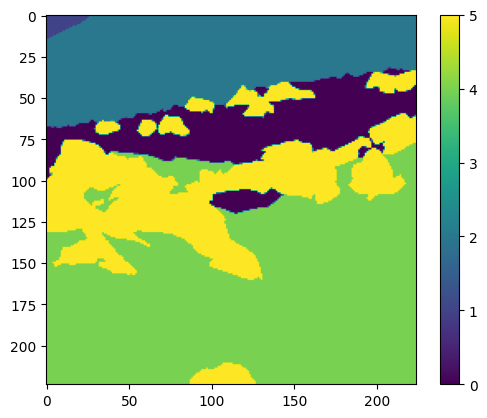

In [10]:
# show images from the dataset
i = 3
plt.imshow(train_labels_sel[i])
print(np.unique(train_labels_sel[i]))
plt.colorbar()

In [11]:
def transform_labels(segmentation):
    # Initialize a new array of zeros with the same shape as the segmentation
    transformed = np.ones_like(segmentation)

    transformed[(segmentation == 0) |
                (segmentation == 3) |
                (segmentation == 4) |
                (segmentation == 7) ] = 0
    
    return transformed

transformed_segmentations = [transform_labels(segmentation) for segmentation in train_labels_sel]

transformed_val_segmentations = [transform_labels(segmentation) for segmentation in val_labels_sel]

transformed_test_segmentations = [transform_labels(segmentation) for segmentation in test_labels_sel]

In [12]:
# expand dimensions of masks
train_labels = np.expand_dims(transformed_segmentations, axis=3)
val_labels = np.expand_dims(transformed_val_segmentations, axis=3)
test_labels = np.expand_dims(transformed_test_segmentations, axis=3)

In [13]:
print(train_labels.shape)
print(val_labels.shape)
print(test_labels.shape)

(148, 224, 224, 1)
(34, 224, 224, 1)
(126, 224, 224, 1)


[0 1 2 3 4 5]
1


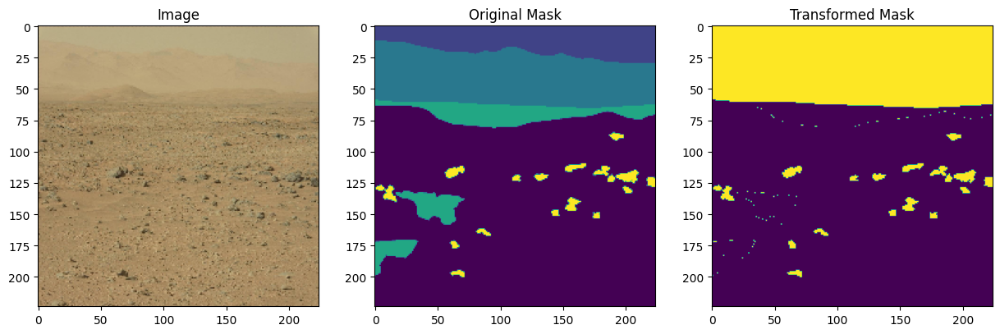

In [14]:
# show multiple samples of transformed masks
i = 5
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(train_images_sel[i])
ax[0].set_title('Image')
ax[1].imshow(train_labels_sel[i])
ax[1].set_title('Original Mask')
print(np.unique(train_labels_sel[i]))
ax[2].imshow(transformed_segmentations[i])
print(np.max(transformed_segmentations[i]))
ax[2].set_title('Transformed Mask')
plt.show()

In [15]:
# create tf datasets
train_dataset = tf.data.Dataset.from_tensor_slices((train_images_sel, train_labels))
val_dataset = tf.data.Dataset.from_tensor_slices((val_images_sel, val_labels))
test_dataset = tf.data.Dataset.from_tensor_slices((test_images_sel, test_labels))

In [16]:
def convert_to_grayscale(image, mask):
    image = tf.image.rgb_to_grayscale(image)
    return image, mask

# Convert entire dataset to grayscale
train_dataset = train_dataset.map(convert_to_grayscale)
val_dataset = val_dataset.map(convert_to_grayscale)
test_dataset = test_dataset.map(convert_to_grayscale)

In [17]:
# show shape of datasets
for image, mask in test_dataset.take(5):
    print(image.shape)
    print(mask.shape)

(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)
(224, 224, 1)


In [18]:
class CustomAugmentationLayer(tf.keras.layers.Layer):
    def __init__(self, seed=42, **kwargs):
        super(CustomAugmentationLayer, self).__init__(**kwargs)
        self.seed = seed
        self.augmentation_layers = tf.keras.Sequential([
            tf.keras.layers.experimental.preprocessing.RandomRotation(factor=0.02, fill_mode='nearest'),
            tf.keras.layers.experimental.preprocessing.RandomZoom(height_factor=(-0.3, 0.0), width_factor=(-0.3, 0.0), fill_mode='nearest'),
            tf.keras.layers.experimental.preprocessing.RandomFlip(mode="horizontal"),
        ])

    def call(self, inputs):
        image, mask = inputs
        mask = tf.cast(mask, image.dtype)
        image_and_mask = tf.concat([image, mask], axis=-1)  # Concatenate image and mask along the channel dimension
        augmented_image_and_mask = self.augmentation_layers(image_and_mask, training=True)
        augmented_image, augmented_mask = tf.split(augmented_image_and_mask, num_or_size_splits=[1, 1], axis=-1)  # Split the augmented image and mask
        
        return augmented_image, augmented_mask

def augment(image, mask):
    
    if image.shape[-1] == 3:
        image = tf.image.rgb_to_grayscale(image)
    
    augmentation_pipeline_only_images = tf.keras.Sequential([
        tf.keras.layers.RandomContrast(factor=0.8), # Randomly adjust contrast
        tf.keras.layers.RandomBrightness(factor=0.3, value_range=(0, 1)),  # Randomly adjust brightness
        ])
    
    custom_augment = CustomAugmentationLayer()
    
    image, mask = custom_augment((image, mask))
    
    image = augmentation_pipeline_only_images(image, training=True)
    
    return image, mask     

# Apply the custom augmentation layer to the dataset
augmented_dataset = train_dataset.map(lambda x, y: augment(x, y)).prefetch(AUTOTUNE)

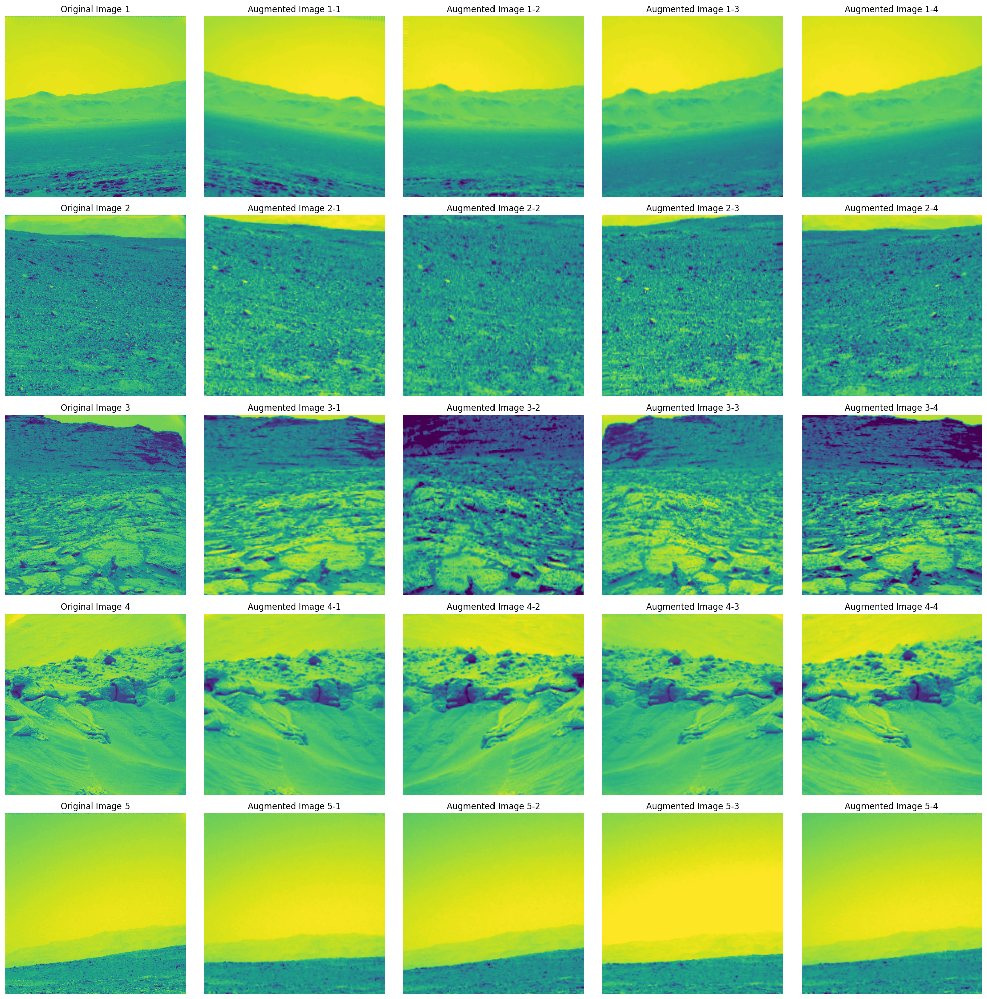

In [19]:
plt.figure(figsize=(20, 20))

# Iterate over multiple images and masks
for j, (x, y) in enumerate(train_dataset.take(5)):
    image = x
    mask = y

    # convert the image and mask to numpy arrays
    image = image.numpy()
    mask = mask.numpy()
    
    # convert mask to array of integer 0 and 1
    #mask = (mask > 0).astype(np.uint8).astype(np.float32)

    # convert the mask to a SegmentationMapsOnImage object

    # Display the original image and mask
    plt.subplot(5, 5, j*5 + 1)
    plt.imshow(image)
    plt.title('Original Image {}'.format(j+1))
    plt.axis('off')

    # Apply the augmentation pipeline to the image and mask multiple times and display the results
    for i in range(2, 6):
        augmented_image, augmented_segmap = augment(image, mask)
        plt.subplot(5, 5, j*5 + i)
        plt.imshow(augmented_image)
        #plt.imshow(augmented_segmap, alpha=0.5)
        plt.title('Augmented Image {}-{}'.format(j+1, i-1))
        plt.axis('off')

plt.tight_layout()
plt.show()

In [20]:
images, masks = load_data("data/mixed")

dataset = tf_dataset(images, masks, batch = 32)

dataset = dataset.map(convert_to_grayscale)

aug_dataset = dataset.map(lambda x, y: augment(x, y)).prefetch(AUTOTUNE)

In [21]:
model = build_unet_model(b_w=True)

In [22]:
model.compile(optimizer="adam", loss='binary_crossentropy', metrics= keras.metrics.AUC())

In [23]:
augmented_dataset = augmented_dataset.batch(32)
val_dataset = val_dataset.batch(32)
test_dataset = test_dataset.batch(32)

In [24]:
model = keras.models.load_model('models/unet_mixed_gray.hdf5')

In [25]:
#model.fit(aug_dataset, epochs=30)

In [26]:
test_images, test_masks = load_data("data/test", test=True)
test_earth = tf_dataset(test_images, test_masks, batch=1, shuffle=False)
test_earth = test_earth.map(convert_to_grayscale)

In [27]:
y_pred_test = model.predict(test_earth)

18/18 [==============================] - 1s 18ms/step


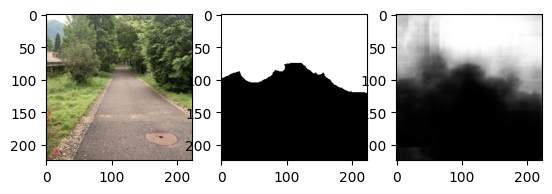

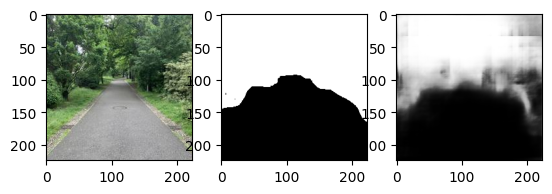

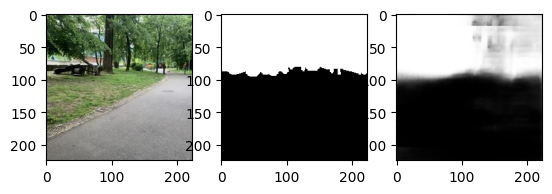

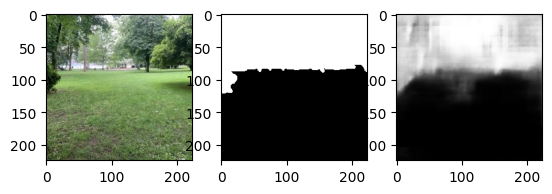

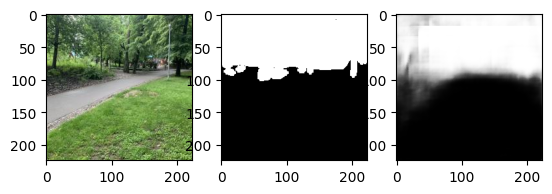

...

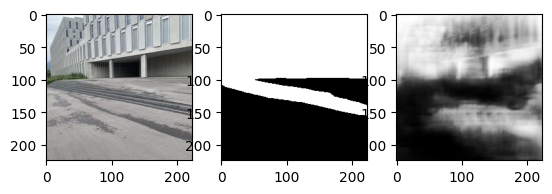

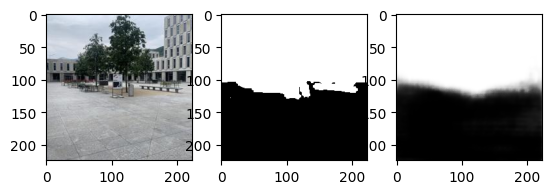

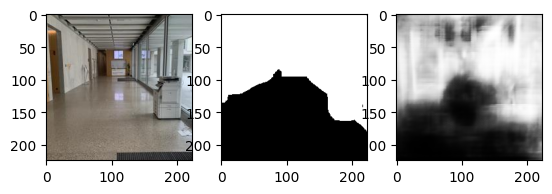

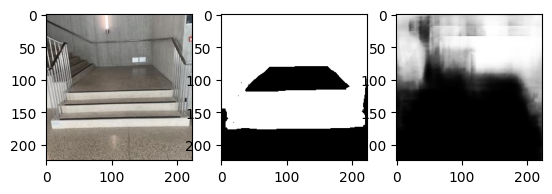

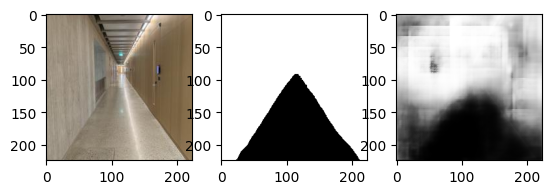

In [28]:
from matplotlib import pyplot as plt

for i in range(len(test_images)):
    fig, ax = plt.subplots(1, 3)
    ax[0].imshow(read_image(test_images[i]))
    ax[1].imshow(read_mask(test_masks[i]), cmap="gray")
    ax[2].imshow(y_pred_test[i], cmap="gray")
    plt.show()

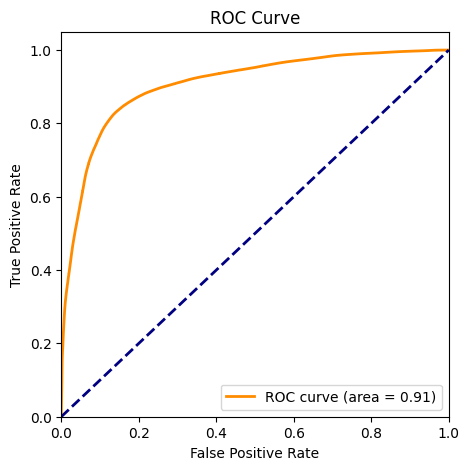

In [29]:
y_true = []
for image in os.listdir("data/test/masks"):
    img = cv2.imread(os.path.join("data/test/masks", image), cv2.IMREAD_GRAYSCALE)
    if np.max(img) > 1:
        img = img/np.max(img)
        img = img > 0.5
        img = img.astype(np.uint8)
    y_true.append(img)
    

y_true = np.array(y_true)
y_true_bin = y_true

# plot the roc curve
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_true_bin.flatten(), y_pred_test.flatten())
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC Curve')
plt.legend(loc="lower right")
 
plt.show()

In [30]:
#model.save("models/unet_mixed_gray.hdf5")

In [31]:
model.fit(augmented_dataset, validation_data=val_dataset, epochs=50)

Epoch 1/50
5/5 [==============================] - 2s 295ms/step - loss: 0.6610 - auc_4: 0.7545 - val_loss: 0.6110 - val_auc_4: 0.8505
Epoch 2/50
5/5 [==============================] - 1s 225ms/step - loss: 0.4777 - auc_4: 0.8508 - val_loss: 0.4601 - val_auc_4: 0.8831
Epoch 3/50
5/5 [==============================] - 1s 215ms/step - loss: 0.5836 - auc_4: 0.7855 - val_loss: 0.4884 - val_auc_4: 0.8623
Epoch 4/50
5/5 [==============================] - 1s 209ms/step - loss: 0.5133 - auc_4: 0.8268 - val_loss: 0.6130 - val_auc_4: 0.8356
Epoch 5/50
5/5 [==============================] - 1s 212ms/step - loss: 0.4608 - auc_4: 0.8720 - val_loss: 0.4917 - val_auc_4: 0.8776
Epoch 6/50
5/5 [==============================] - 1s 222ms/step - loss: 0.4482 - auc_4: 0.8642 - val_loss: 0.6343 - val_auc_4: 0.8746
Epoch 7/50
5/5 [==============================] - 1s 221ms/step - loss: 0.3932 - auc_4: 0.8958 - val_loss: 0.7202 - val_auc_4: 0.8764
Epoch 8/50
5/5 [==============================] - 1s 253ms/ste

In [32]:
y_pred_earth = model.predict(test_earth)

18/18 [==============================] - 0s 3ms/step


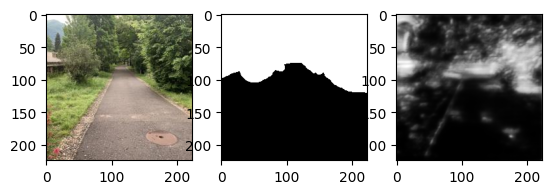

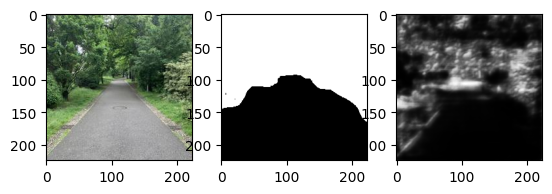

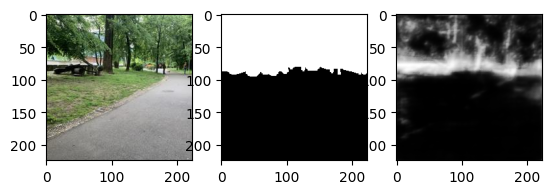

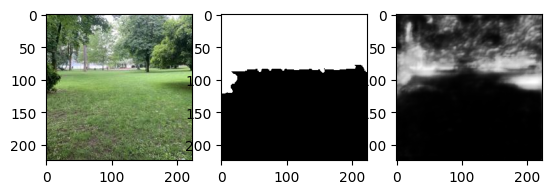

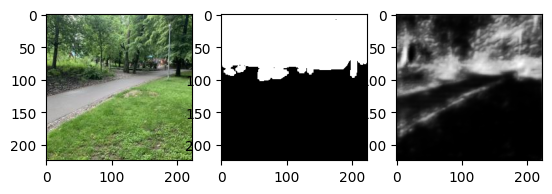

...

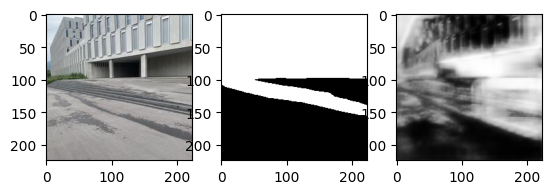

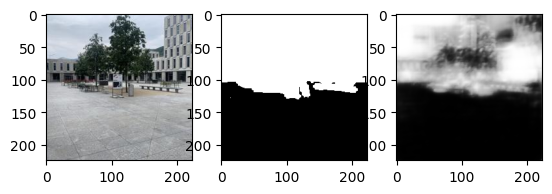

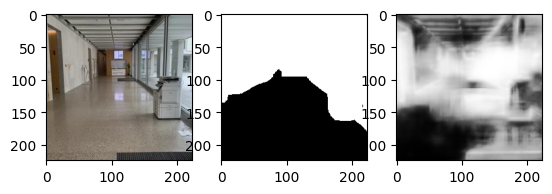

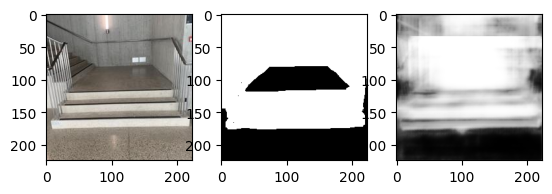

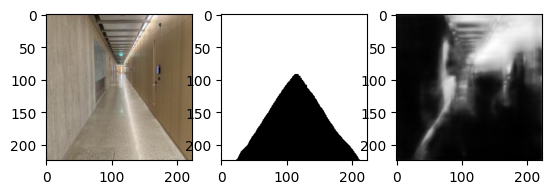

In [33]:
for i in range(len(test_images)):
    fig, ax = plt.subplots(1, 3)
    ax[0].imshow(read_image(test_images[i]))
    ax[1].imshow(read_mask(test_masks[i]), cmap="gray")
    ax[2].imshow(y_pred_earth[i], cmap="gray")
    plt.show()

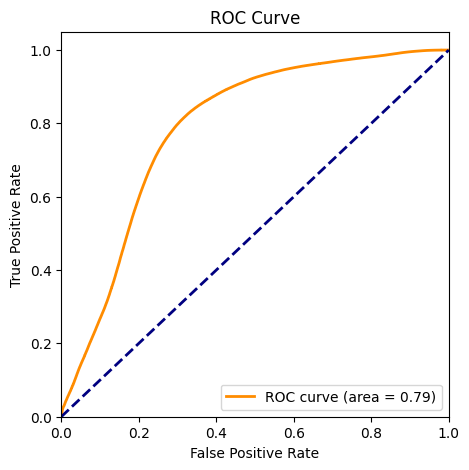

In [34]:
y_true = []
for image in os.listdir("data/test/masks"):
    img = cv2.imread(os.path.join("data/test/masks", image), cv2.IMREAD_GRAYSCALE)
    if np.max(img) > 1:
        img = img/np.max(img)
        img = img > 0.5
        img = img.astype(np.uint8)
    y_true.append(img)
    

y_true = np.array(y_true)
y_true_bin = y_true

# plot the roc curve
from sklearn.metrics import roc_curve, auc

fpr, tpr, thresholds = roc_curve(y_true_bin.flatten(), y_pred_earth.flatten())
roc_auc = auc(fpr, tpr)
 
plt.figure(figsize=(5,5))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

plt.title('ROC Curve')
plt.legend(loc="lower right")
 
plt.show()

In [35]:
y_pred_mars = model.predict(test_dataset)

4/4 [==============================] - 0s 59ms/step


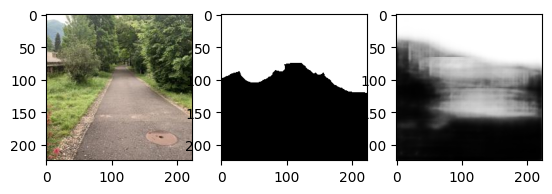

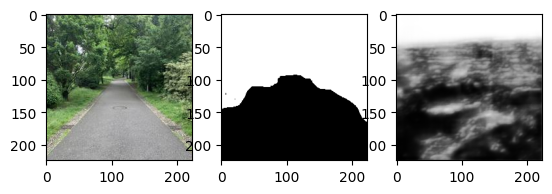

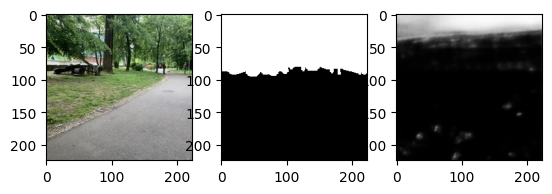

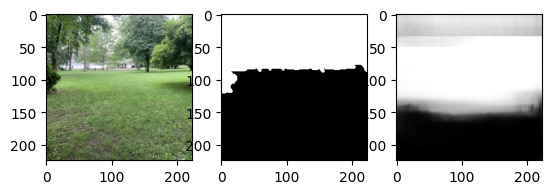

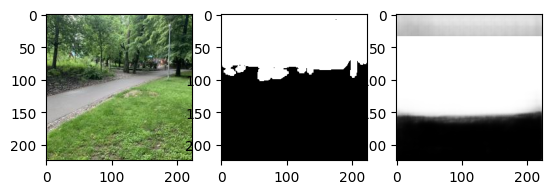

...

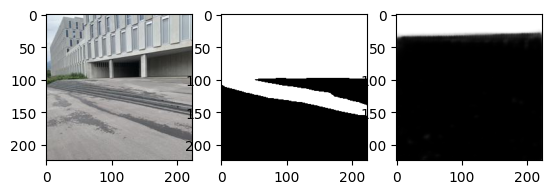

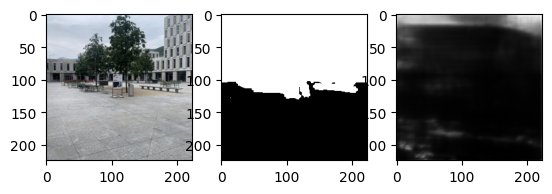

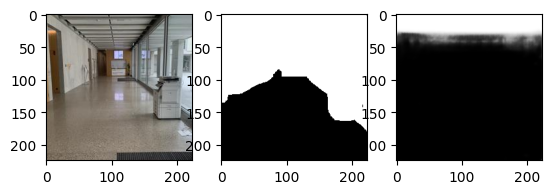

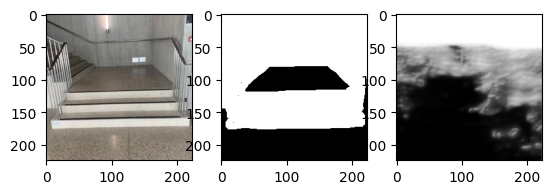

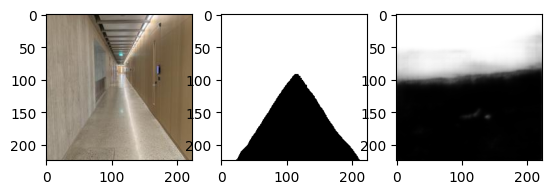

In [36]:
for i in range(len(test_images)):
    fig, ax = plt.subplots(1, 3)
    ax[0].imshow(read_image(test_images[i]))
    ax[1].imshow(read_mask(test_masks[i]), cmap="gray")
    ax[2].imshow(y_pred_mars[i], cmap="gray")
    plt.show()

In [37]:
import numpy as np
import tensorflow as tf
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

def plot_auc_curve_segmentation(model, test_dataset):
    # Lists to store true labels and predictions
    y_true = []
    y_pred = []

    # Iterate over the test dataset
    for (x, y) in test_dataset:
        # Compute predictions
        predictions = model.predict(x)
        y_true.extend(y.numpy().flatten().tolist())
        y_pred.extend(predictions.flatten().tolist())

    # Convert to numpy arrays
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Compute ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    roc_auc = auc(fpr, tpr)

    # Plot ROC curve
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

1/1 [==============================] - 0s 182ms/step


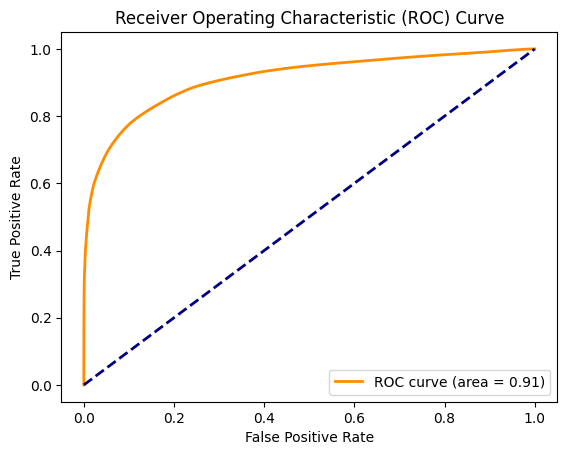

In [38]:
plot_auc_curve_segmentation(model, test_dataset)

In [47]:
def visualize_predictions(model, test_dataset, num_samples=5):
    """
    Visualize model predictions alongside the original image and true mask.
    
    Parameters:
    - model: Trained model.
    - test_dataset: tf.data.Dataset containing test samples.
    - num_samples: Number of samples to visualize from the test dataset.
    """
    
    # Set width for each set of images and height for each row
    width_per_set = 15
    height_per_row = 5
    
    plt.figure(figsize=(width_per_set, height_per_row*num_samples))
    
    # Shuffle the dataset and unbatch it
    samples = test_dataset.shuffle(buffer_size=1000).unbatch().take(num_samples)
    
    for i, (x, y_true) in enumerate(samples):
        
        # Add batch dimension and predict mask using the model
        y_pred = model.predict(tf.expand_dims(x, axis=0))
        y_pred_thresholded = (y_pred > 0.5).astype(np.float32)  # Threshold predictions to get binary mask
        
        # Plot original image
        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(tf.squeeze(x), cmap='gray')  # Assuming single-channel (grayscale) images
        plt.title('Original Image')
        plt.axis('off')
        
        # Plot true mask
        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(tf.squeeze(y_true), cmap='gray')
        plt.title('True Mask')
        plt.axis('off')
        
        # Plot predicted mask
        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(tf.squeeze(y_pred_thresholded), cmap='gray')
        plt.title('Predicted Mask')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

1/1 [==============================] - 0s 16ms/step


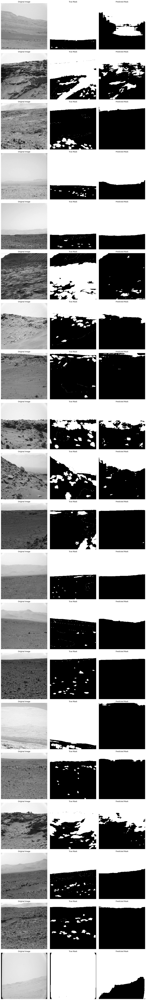

In [48]:
visualize_predictions(model, test_dataset, num_samples=20)